# Some Yolov4 Data Augmentation Techniques - Demo

In [1]:
import cv2
import numpy as np
import random
from config import DATA_DIR, ANNO_DIR, TARGET_DIR, TARGET_ANNO, TOTAL_SAMPLES
from augmentation_techniques import mosaic, mix_up, cut_mix, grid_mask
from utils import load_annotation, display_box
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def unpack_data(data):
    images = []
    bboxes_list = []
    for img_data in data:
        img = cv2.imread(f"{DATA_DIR}/{img_data['name']}")
        images.append(img)
        bboxes_list.append(img_data['bboxes'])

    return images, bboxes_list

In [3]:
data = load_annotation(f"{ANNO_DIR}/sample_annotation.txt")
# shuffle all the images
random.shuffle(data)

# SAMPLES = len(data) * 0.1
SAMPLES = 5

In [4]:
def plotImages(imgList):
    fig, axes = plt.subplots(1, SAMPLES, figsize=(40, 40))
    axes = axes.flatten()
    for img, ax in zip(imgList, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

## Mosaic

Not enough boxes
Not enough boxes
Not enough boxes
Not enough boxes
Not enough boxes
Not enough boxes
Not enough boxes


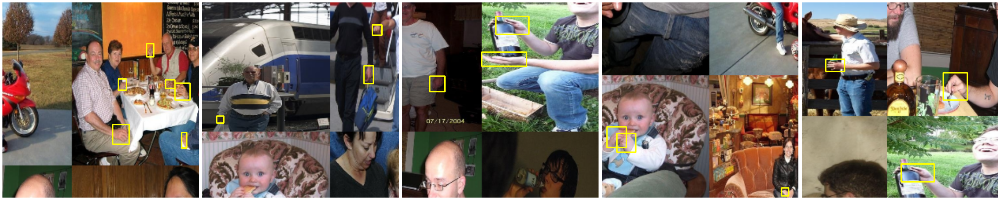

In [5]:
# mosaic
count = 0
imgList = []
while True:
    # choose 4 images
    chosen_images = np.random.choice(data, 4, replace=False)
    images, bboxes_list = unpack_data(chosen_images)
    img, bboxes = mosaic(images, bboxes_list, 3)

    if img is None or bboxes is None:
        print("Not enough boxes")
        continue

    result_img = display_box(img, bboxes)
    imgList.append(result_img[:, :, ::-1])

    count += 1
    if count >= SAMPLES:
        break
plotImages(imgList)

## Mix Up

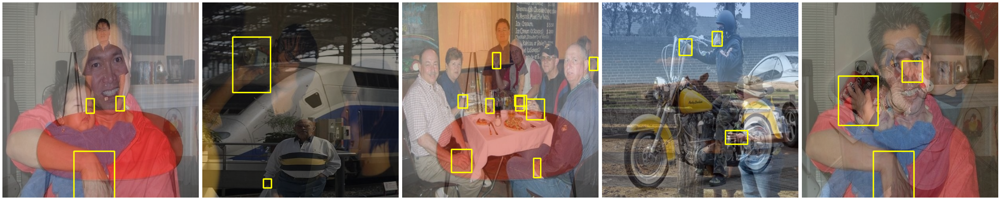

In [6]:
# mixup
count = 0
imgList = []
while True:
    # choose 4 images
    chosen_images = np.random.choice(data, 2, replace=False)
    images, bboxes_list = unpack_data(chosen_images)
    img, bboxes = mix_up(images, bboxes_list, 1)

    if img is None or bboxes is None:
        print("Not enough boxes")
        continue

    result_img = display_box(img, bboxes)
    imgList.append(result_img[:, :, ::-1])

    count += 1
    if count >= SAMPLES:
        break
plotImages(imgList)

## Cut Mix

Not enough boxes
Not enough boxes
Not enough boxes


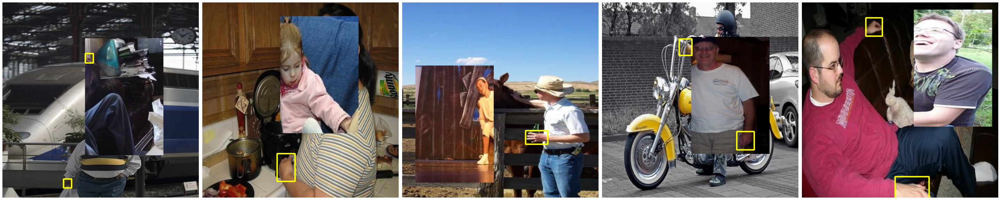

In [7]:
# cut mix
count = 0
imgList = []
while True:
    # choose 4 images
    chosen_images = np.random.choice(data, 2, replace=False)
    images, bboxes_list = unpack_data(chosen_images)
    img, bboxes = cut_mix(images, bboxes_list, 1)

    if img is None or bboxes is None:
        print("Not enough boxes")
        continue

    result_img = display_box(img, bboxes)
    imgList.append(result_img[:, :, ::-1])

    count += 1
    if count >= SAMPLES:
        break
plotImages(imgList)

## Grid Mask

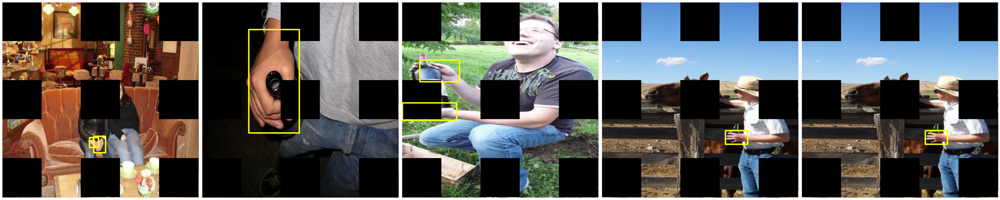

In [8]:
count = 0
imgList = []
while True:
    # choose 4 images
    chosen_images = np.random.choice(data, 1, replace=False)
    images, bboxes_list = unpack_data(chosen_images)
    img, bboxes = grid_mask(images[0], bboxes_list[0])

    if img is None or bboxes is None:
        print("Not enough boxes")
        continue

    result_img = display_box(img, bboxes)
    imgList.append(result_img[:, :, ::-1])

    count += 1
    if count >= SAMPLES:
        break
plotImages(imgList)